# Problem Statements

- Perform Principal component analysis and perform clustering using first 
- 3 principal component scores (both heirarchial and k mean clustering(scree plot or elbow curve) and obtain 
- optimum number of clusters and check whether we have obtained same number of clusters with the original data 
- (class column we have ignored at the begining who shows it has 3 clusters)df

# Import all necessary laibiries

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings 
warnings.filterwarnings("ignore")
plt.rcParams["figure.figsize"] = (10,5)
plt.rcParams["figure.dpi"] = 250
%matplotlib inline
sns.set_theme(style = "darkgrid")

# Import dataset

In [5]:
df = pd.read_csv("wine.csv")
df

,Type,Alcohol,Malic,Ash,Alcalinity,Magnesium,Phenols,Flavanoids,Nonflavanoids,Proanthocyanins,Color,Hue,Dilution,Proline
0,1,14.23,1.71,2.43,15.6,127,2.80,3.06,0.28,2.29,5.64,1.04,3.92,1065
1,1,13.20,1.78,2.14,11.2,100,2.65,2.76,0.26,1.28,4.38,1.05,3.40,1050
2,1,13.16,2.36,2.67,18.6,101,2.80,3.24,0.30,2.81,5.68,1.03,3.17,1185
3,1,14.37,1.95,2.50,16.8,113,3.85,3.49,0.24,2.18,7.80,0.86,3.45,1480
4,1,13.24,2.59,2.87,21.0,118,2.80,2.69,0.39,1.82,4.32,1.04,2.93,735
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
173,3,13.71,5.65,2.45,20.5,95,1.68,0.61,0.52,1.06,7.70,0.64,1.74,740
174,3,13.40,3.91,2.48,23.0,102,1.80,0.75,0.43,1.41,7.30,0.70,1.56,750
175,3,13.27,4.28,2.26,20.0,120,1.59,0.69,0.43,1.35,10.20,0.59,1.56,835
176,3,13.17,2.59,2.37,20.0,120,1.65,0.68,0.53,1.46,9.30,0.60,1.62,840


# EDA (Exploratory Data Analysis)

- Exploratory Data Analysis (EDA) is an approach to analyze the data using visual techniques and statistical techniques. It is used to discover trends, patterns, or to check assumptions with the help of statistical summary and graphical representations.

**Steps involved in EDA**
1. Describing the data
2. Data cleaning
3. Imputation techniques
4. Data analysis and visualization
5. Transformations
6. Auto EDA

# Describing the data

In [6]:
df.describe()

,Type,Alcohol,Malic,Ash,Alcalinity,Magnesium,Phenols,Flavanoids,Nonflavanoids,Proanthocyanins,Color,Hue,Dilution,Proline
count,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000
mean,1.938202,13.000618,2.336348,2.366517,19.494944,99.741573,2.295112,2.029270,0.361854,1.590899,5.058090,0.957449,2.611685,746.893258
std,0.775035,0.811827,1.117146,0.274344,3.339564,14.282484,0.625851,0.998859,0.124453,0.572359,2.318286,0.228572,0.709990,314.907474
min,1.000000,11.030000,0.740000,1.360000,10.600000,70.000000,0.980000,0.340000,0.130000,0.410000,1.280000,0.480000,1.270000,278.000000
25%,1.000000,12.362500,1.602500,2.210000,17.200000,88.000000,1.742500,1.205000,0.270000,1.250000,3.220000,0.782500,1.937500,500.500000
50%,2.000000,13.050000,1.865000,2.360000,19.500000,98.000000,2.355000,2.135000,0.340000,1.555000,4.690000,0.965000,2.780000,673.500000
75%,3.000000,13.677500,3.082500,2.557500,21.500000,107.000000,2.800000,2.875000,0.437500,1.950000,6.200000,1.120000,3.170000,985.000000
max,3.000000,14.830000,5.800000,3.230000,30.000000,162.000000,3.880000,5.080000,0.660000,3.580000,13.000000,1.710000,4.000000,1680.000000


In [7]:
df.dtypes

Type                 int64
Alcohol            float64
Malic              float64
Ash                float64
Alcalinity         float64
Magnesium            int64
Phenols            float64
Flavanoids         float64
Nonflavanoids      float64
Proanthocyanins    float64
Color              float64
Hue                float64
Dilution           float64
Proline              int64
dtype: object

In [8]:
df.isnull().sum()

Type               0
Alcohol            0
Malic              0
Ash                0
Alcalinity         0
Magnesium          0
Phenols            0
Flavanoids         0
Nonflavanoids      0
Proanthocyanins    0
Color              0
Hue                0
Dilution           0
Proline            0
dtype: int64

In [9]:
df.duplicated().sum()

0

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 178 entries, 0 to 177
Data columns (total 14 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Type             178 non-null    int64  
 1   Alcohol          178 non-null    float64
 2   Malic            178 non-null    float64
 3   Ash              178 non-null    float64
 4   Alcalinity       178 non-null    float64
 5   Magnesium        178 non-null    int64  
 6   Phenols          178 non-null    float64
 7   Flavanoids       178 non-null    float64
 8   Nonflavanoids    178 non-null    float64
 9   Proanthocyanins  178 non-null    float64
 10  Color            178 non-null    float64
 11  Hue              178 non-null    float64
 12  Dilution         178 non-null    float64
 13  Proline          178 non-null    int64  
dtypes: float64(11), int64(3)
memory usage: 19.6 KB


# Visualizing missing values

<Axes: >

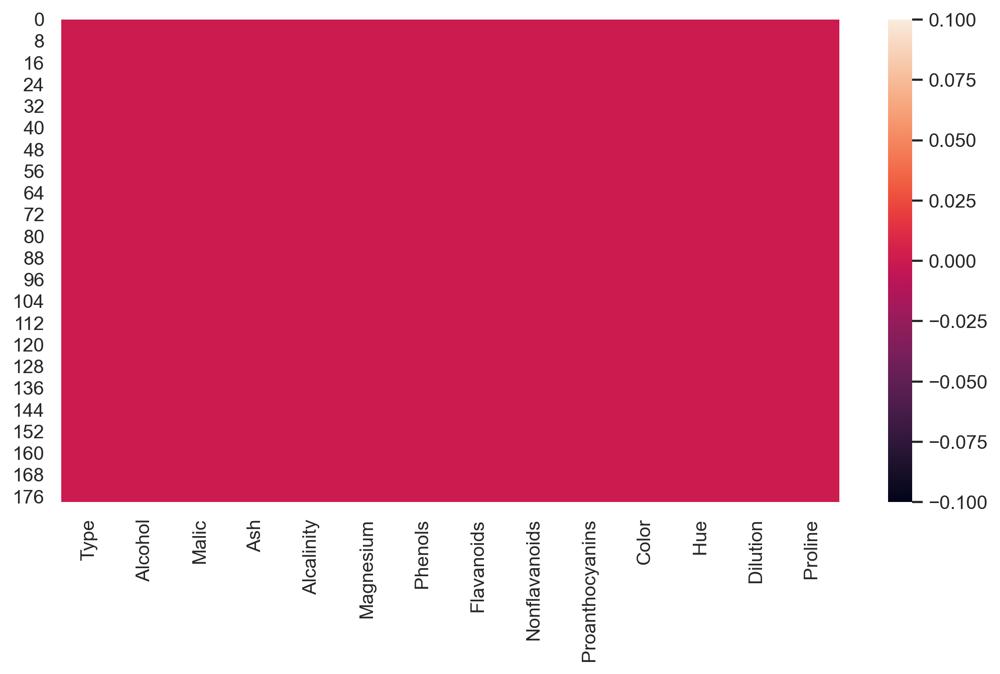

In [11]:
sns.heatmap(df.isnull())

# Outlier detection

- There are multiple approaches to detect outliers in the dataset.
    - Histogram
    - Boxplot
    - Descriptive stats for df

In [13]:
df.describe()

,Type,Alcohol,Malic,Ash,Alcalinity,Magnesium,Phenols,Flavanoids,Nonflavanoids,Proanthocyanins,Color,Hue,Dilution,Proline
count,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000
mean,1.938202,13.000618,2.336348,2.366517,19.494944,99.741573,2.295112,2.029270,0.361854,1.590899,5.058090,0.957449,2.611685,746.893258
std,0.775035,0.811827,1.117146,0.274344,3.339564,14.282484,0.625851,0.998859,0.124453,0.572359,2.318286,0.228572,0.709990,314.907474
min,1.000000,11.030000,0.740000,1.360000,10.600000,70.000000,0.980000,0.340000,0.130000,0.410000,1.280000,0.480000,1.270000,278.000000
25%,1.000000,12.362500,1.602500,2.210000,17.200000,88.000000,1.742500,1.205000,0.270000,1.250000,3.220000,0.782500,1.937500,500.500000
50%,2.000000,13.050000,1.865000,2.360000,19.500000,98.000000,2.355000,2.135000,0.340000,1.555000,4.690000,0.965000,2.780000,673.500000
75%,3.000000,13.677500,3.082500,2.557500,21.500000,107.000000,2.800000,2.875000,0.437500,1.950000,6.200000,1.120000,3.170000,985.000000
max,3.000000,14.830000,5.800000,3.230000,30.000000,162.000000,3.880000,5.080000,0.660000,3.580000,13.000000,1.710000,4.000000,1680.000000


<function matplotlib.pyplot.tight_layout(*, pad=1.08, h_pad=None, w_pad=None, rect=None)>

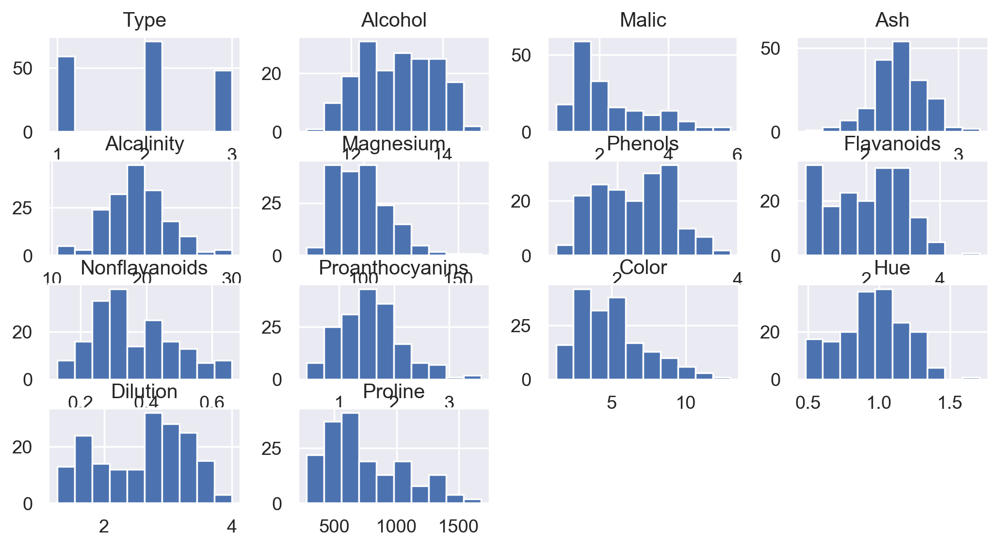

In [14]:
df.hist()
plt.tight_layout

<Axes: >

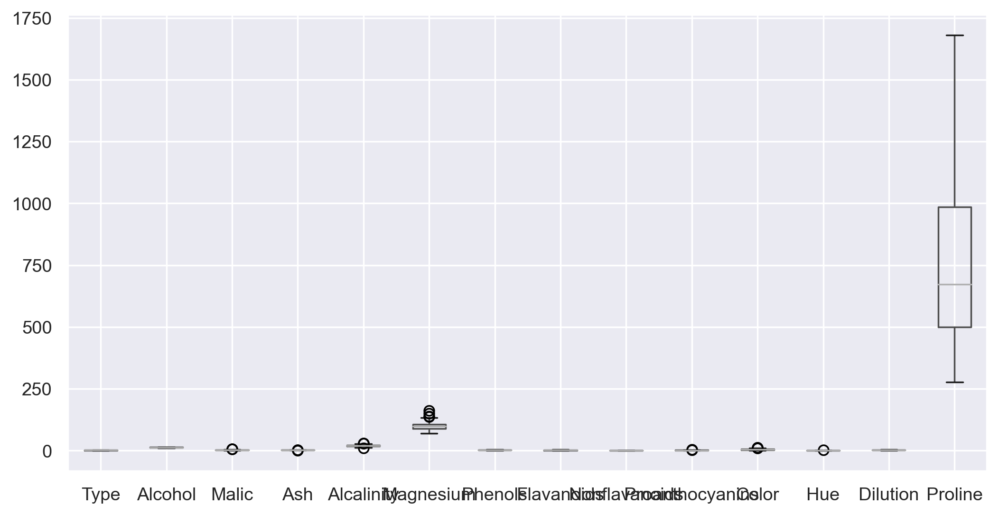

In [15]:
df.boxplot()

# While looking at the above box plot the so many data columns have outlier. Hence, before creating the model we should handle the outilers.

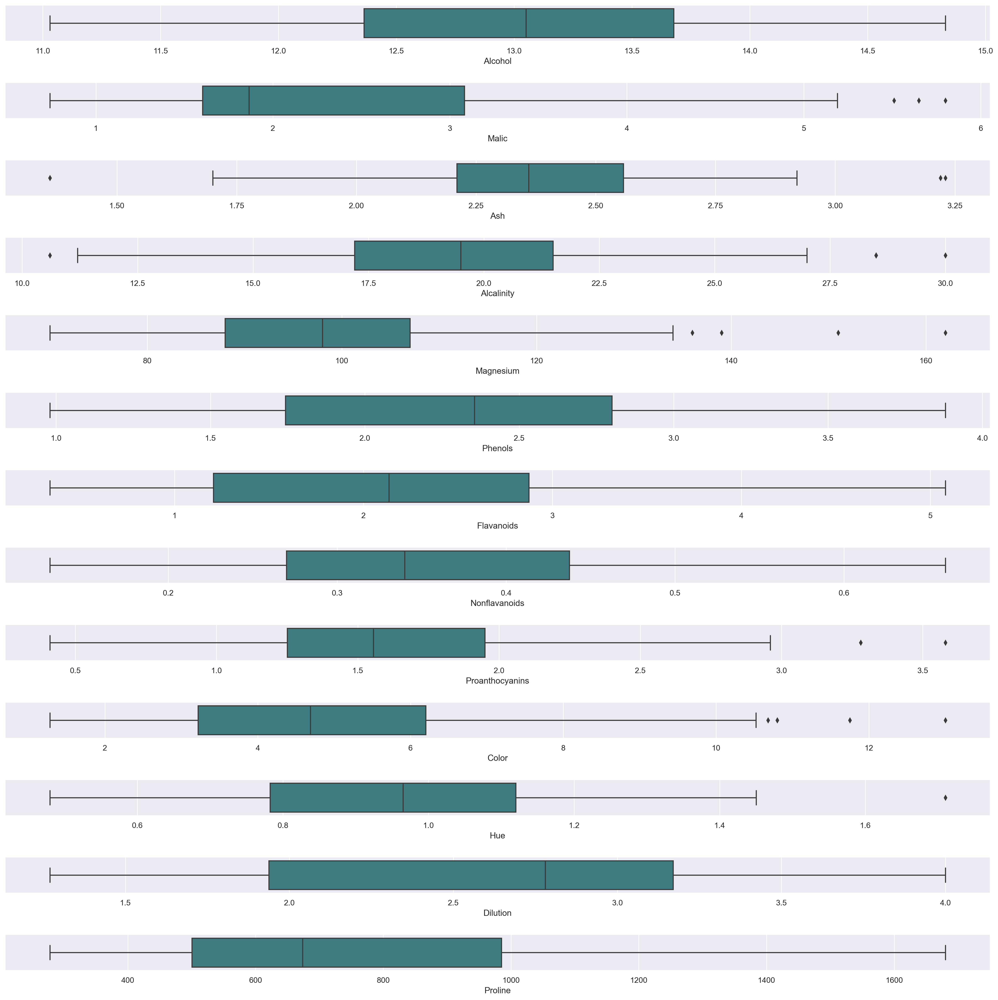

In [23]:
ot=df.copy() 
fig, axes=plt.subplots(13,1,figsize=(20,20),sharex=False,sharey=False)
sns.boxplot(x='Alcohol',data=ot,palette='crest',ax=axes[0])
sns.boxplot(x='Malic',data=ot,palette='crest',ax=axes[1])
sns.boxplot(x='Ash',data=ot,palette='crest',ax=axes[2])
sns.boxplot(x='Alcalinity',data=ot,palette='crest',ax=axes[3])
sns.boxplot(x='Magnesium',data=ot,palette='crest',ax=axes[4])
sns.boxplot(x='Phenols',data=ot,palette='crest',ax=axes[5])
sns.boxplot(x='Flavanoids',data=ot,palette='crest',ax=axes[6])
sns.boxplot(x='Nonflavanoids',data=ot,palette='crest',ax=axes[7])
sns.boxplot(x='Proanthocyanins',data=ot,palette='crest',ax=axes[8])
sns.boxplot(x='Color',data=ot,palette='crest',ax=axes[9])
sns.boxplot(x='Hue',data=ot,palette='crest',ax=axes[10])
sns.boxplot(x='Dilution',data=ot,palette='crest',ax=axes[11])
sns.boxplot(x='Proline',data=ot,palette='crest',ax=axes[12])
plt.tight_layout(pad=2.0)

# Outlier detection function

In [28]:
def outlier_detection (data,colname):
    q1 = data[colname].quantile(0.25)
    q3 = data[colname].quantile(0.75)
    iqr = q3 - q1
    
    upper = q3+1.5*iqr
    lower = q1-1.5*iqr
    
    return lower, upper

In [29]:
df.columns

Index(['Type', 'Alcohol', 'Malic', 'Ash', 'Alcalinity', 'Magnesium', 'Phenols',
       'Flavanoids', 'Nonflavanoids', 'Proanthocyanins', 'Color', 'Hue',
       'Dilution', 'Proline'],
      dtype='object')

In [30]:
outlier_detection(df, "Malic")

(-0.6174999999999997, 5.3025)

In [31]:
df.loc[df["Malic"]>5.3025, "Malic"]

123    5.80
137    5.51
173    5.65
Name: Malic, dtype: float64

# Capping Outliers

Text(0.5, 1.0, 'Before the replacing the outiler with upper extreme values')

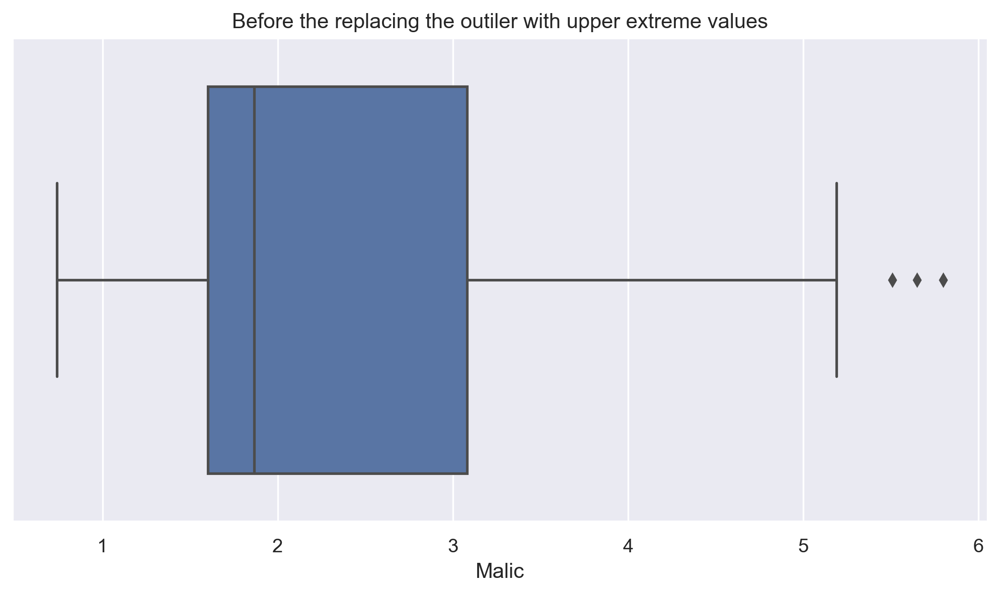

In [32]:
sns.boxplot(x= df["Malic"])
plt.xlabel("Malic")
plt.title("Before the replacing the outiler with upper extreme values")

In [33]:
df.loc[df["Malic"]>5.3025, "Malic"] = 5.3025

Text(0.5, 1.0, 'After the replacing the outiler with upper extreme values')

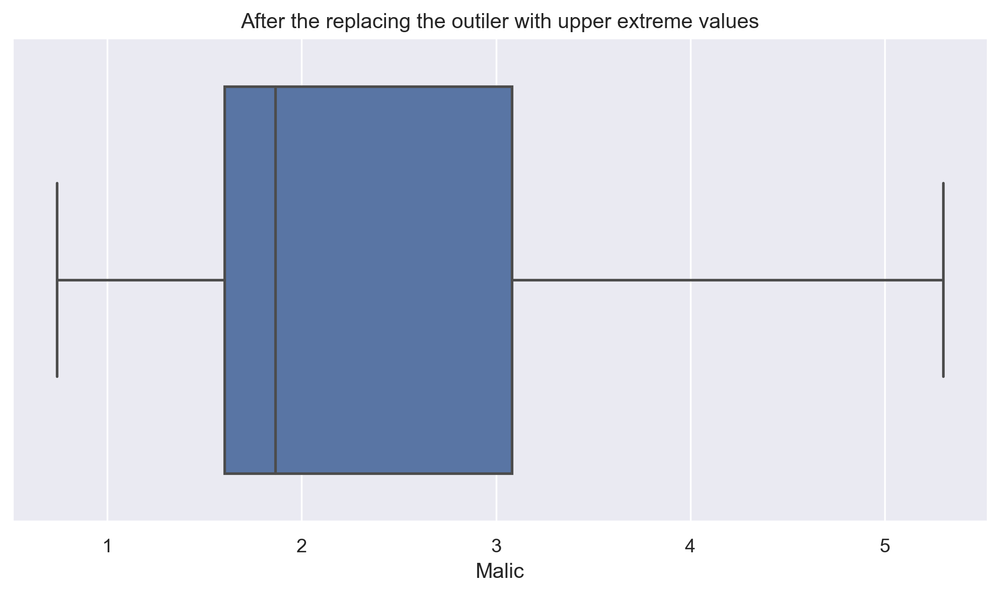

In [34]:
sns.boxplot(x= df["Malic"])
plt.xlabel("Malic")
plt.title("After the replacing the outiler with upper extreme values")

In [35]:
outlier_detection(df, "Ash")

(1.6887499999999998, 3.0787500000000003)

In [37]:
df.loc[df["Ash"]>3.08]

,Type,Alcohol,Malic,Ash,Alcalinity,Magnesium,Phenols,Flavanoids,Nonflavanoids,Proanthocyanins,Color,Hue,Dilution,Proline
25,1,13.05,2.05,3.22,25.0,124,2.63,2.68,0.47,1.92,3.58,1.13,3.20,830
121,2,11.56,2.05,3.23,28.5,119,3.18,5.08,0.47,1.87,6.00,0.93,3.69,465


Text(0.5, 1.0, 'Before the replacing the outiler with upper and lower extreme values')

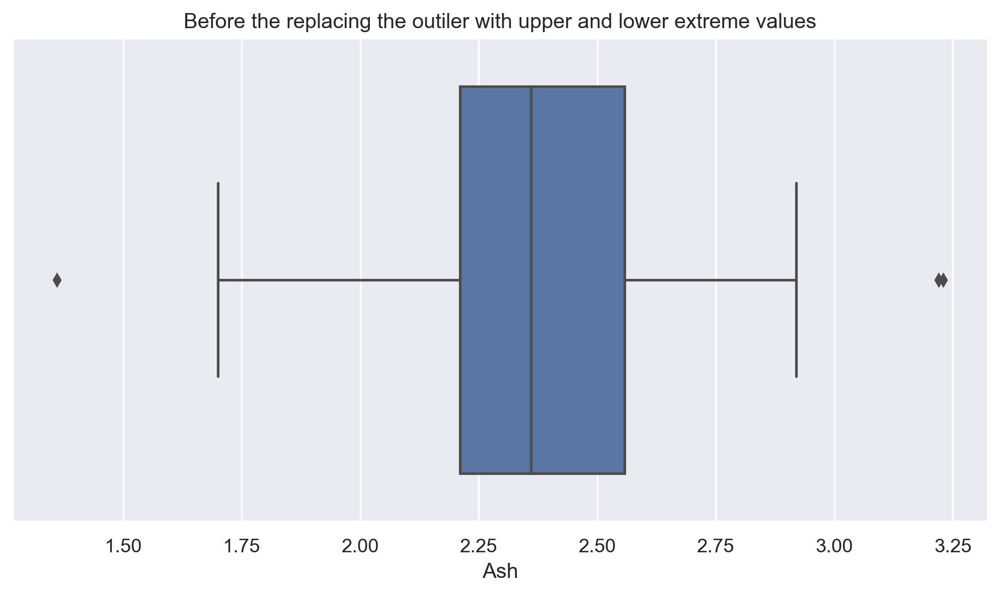

In [38]:
sns.boxplot(x= df["Ash"])
plt.xlabel("Ash")
plt.title("Before the replacing the outiler with upper and lower extreme values")

In [47]:
df.loc[df["Ash"]>3.0787500000000003, "Ash"] = 3.0787500000000003

In [49]:
df.loc[df["Ash"]<1.6887499999999998, "Ash"] = 1.6887499999999998

Text(0.5, 1.0, 'After the replacing the outiler with upper and lower extreme values')

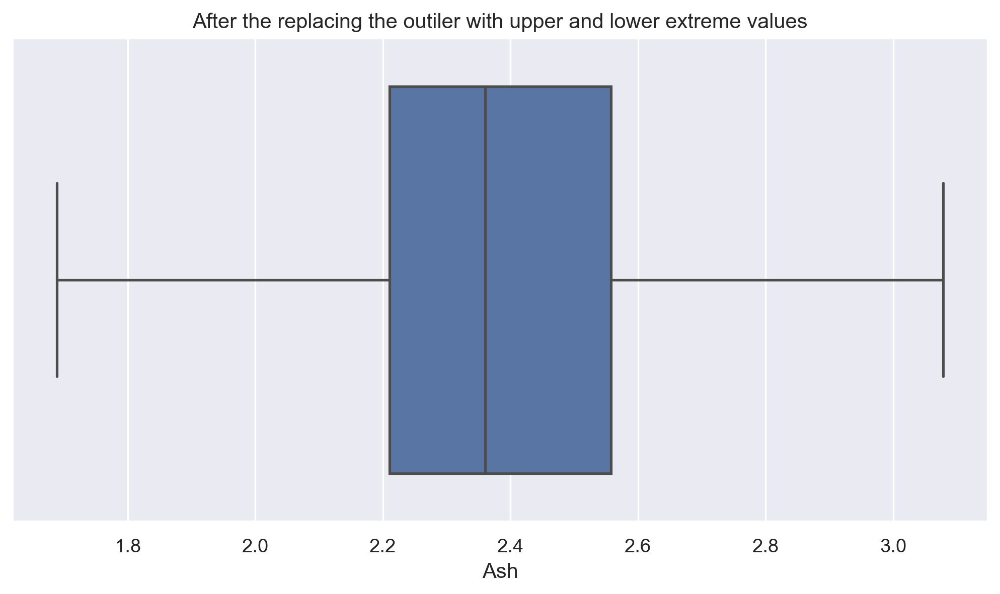

In [50]:
sns.boxplot(x= df["Ash"])
plt.xlabel("Ash")
plt.title("After the replacing the outiler with upper and lower extreme values")

In [51]:
outlier_detection(df, "Alcalinity")

(10.749999999999998, 27.950000000000003)

Text(0.5, 1.0, 'Before the replacing the outiler with upper and lower extreme values')

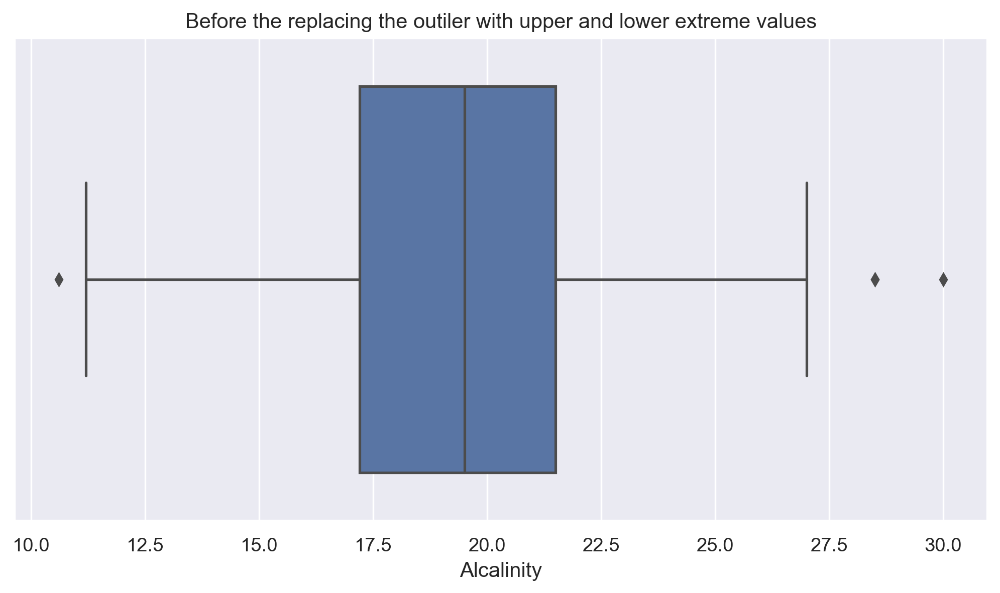

In [52]:
sns.boxplot(x= df["Alcalinity"])
plt.xlabel("Alcalinity")
plt.title("Before the replacing the outiler with upper and lower extreme values")

In [55]:
df.loc[df['Alcalinity']>27.950000000000003, "Alcalinity"] = 27.950000000000003

In [57]:
df.loc[df["Alcalinity"]<10.749999999999998, "Alcalinity"] = 10.749999999999998

Text(0.5, 1.0, 'After the replacing the outiler with upper and lower extreme values')

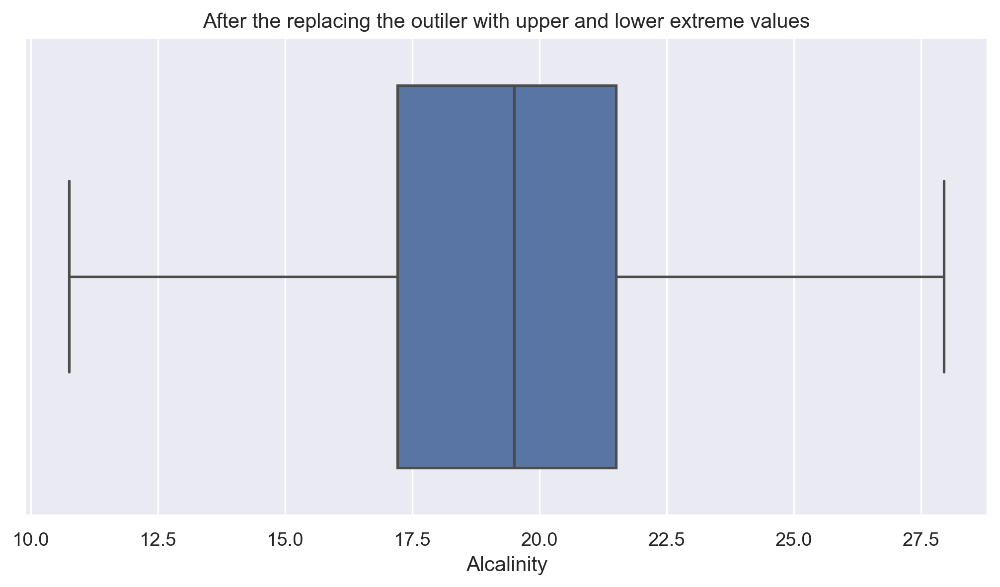

In [58]:
sns.boxplot(x= df["Alcalinity"])
plt.xlabel("Alcalinity")
plt.title("After the replacing the outiler with upper and lower extreme values")

In [59]:
outlier_detection(df, "Magnesium")

(59.5, 135.5)

Text(0.5, 1.0, 'Before the replacing the outiler with upper extreme values')

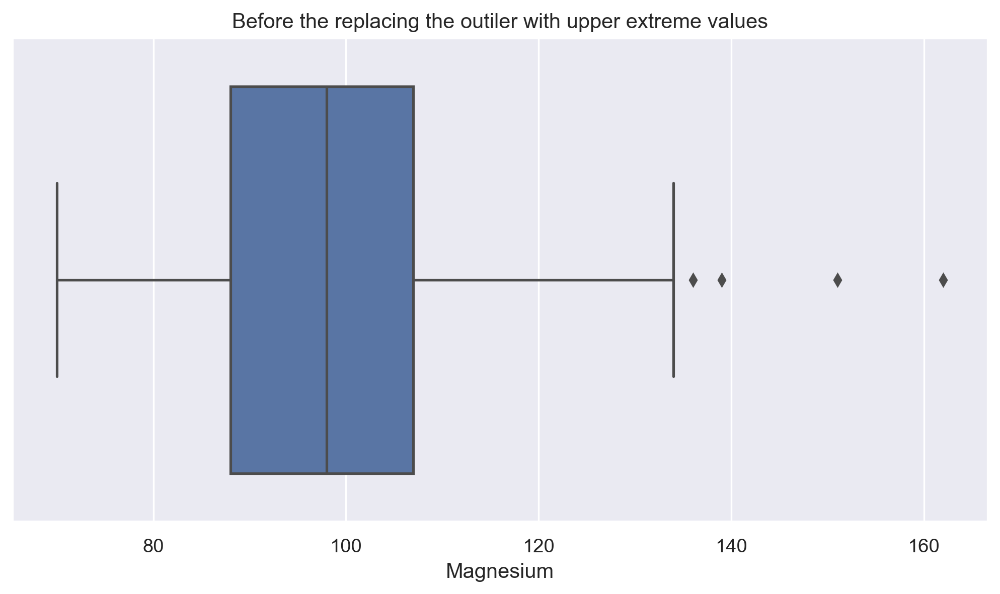

In [61]:
sns.boxplot(x= df["Magnesium"])
plt.xlabel("Magnesium")
plt.title("Before the replacing the outiler with upper extreme values")

In [64]:
df.loc[df["Magnesium"]>135.5, "Magnesium"] = 135.5

Text(0.5, 1.0, 'After the replacing the outiler with upper extreme values')

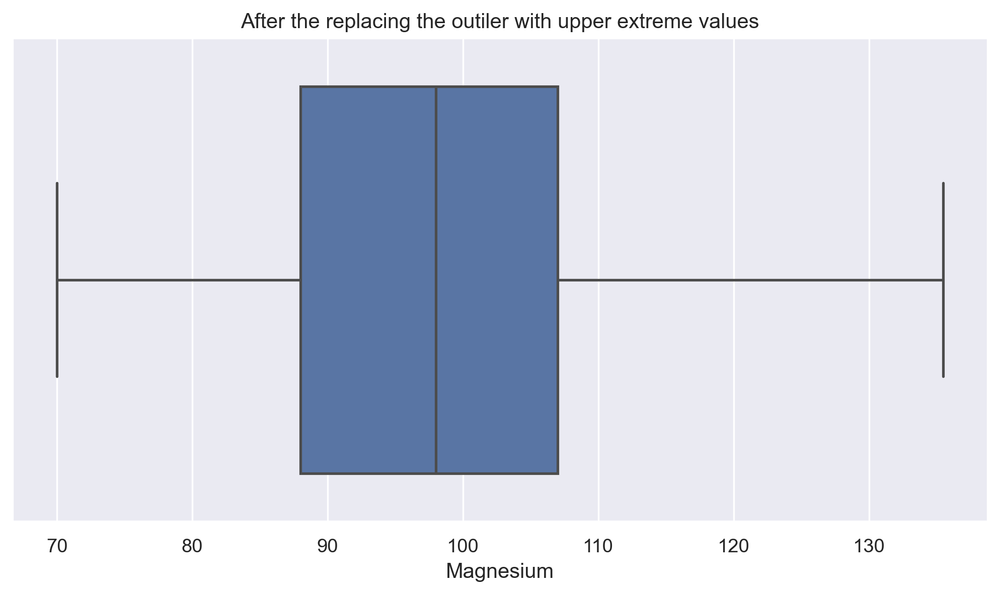

In [65]:
sns.boxplot(x= df["Magnesium"])
plt.xlabel("Magnesium")
plt.title("After the replacing the outiler with upper extreme values")

In [66]:
outlier_detection(df, "Proanthocyanins")

(0.20000000000000018, 3.0)

Text(0.5, 1.0, 'Before the replacing the outiler with upper extreme values')

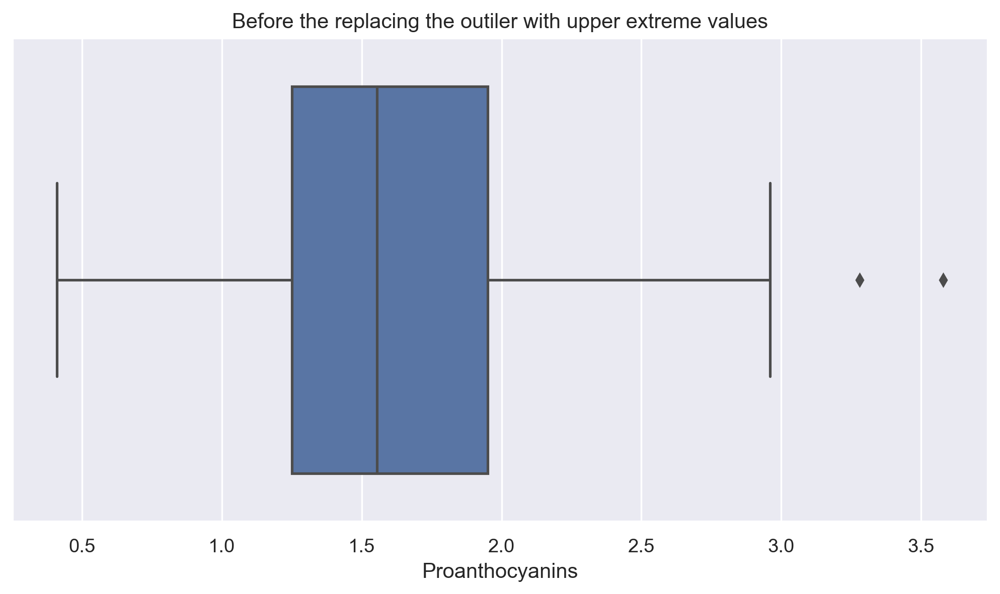

In [67]:
sns.boxplot(x= df["Proanthocyanins"])
plt.xlabel("Proanthocyanins")
plt.title("Before the replacing the outiler with upper extreme values")

In [69]:
df.loc[df["Proanthocyanins"]>3.0, "Proanthocyanins"] = 3.0

Text(0.5, 1.0, 'After the replacing the outiler with upper extreme values')

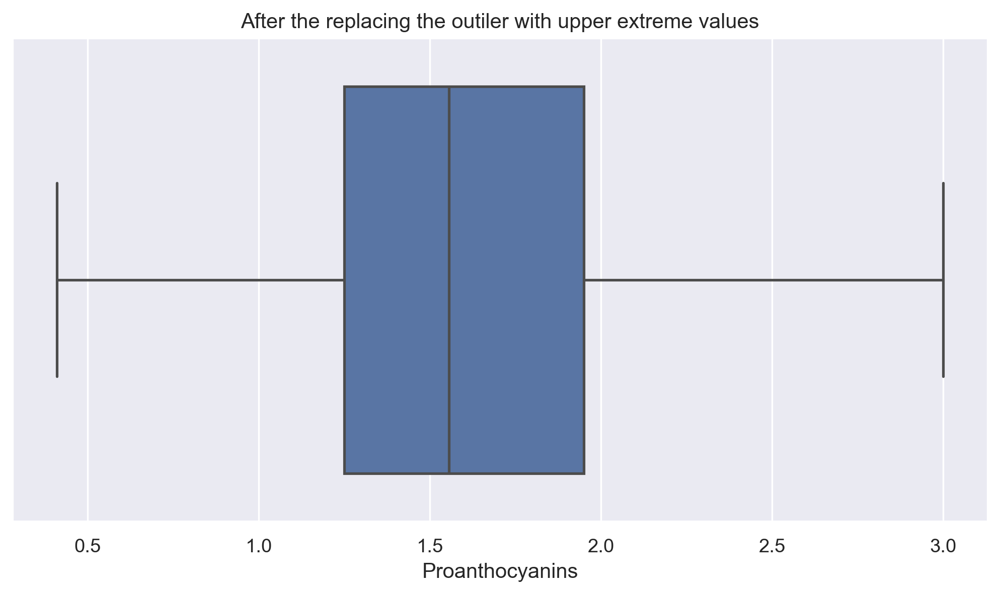

In [70]:
sns.boxplot(x= df["Proanthocyanins"])
plt.xlabel("Proanthocyanins")
plt.title("After the replacing the outiler with upper extreme values")

In [71]:
outlier_detection(df, "Color")

(-1.2500000000000009, 10.670000000000002)

Text(0.5, 1.0, 'Before the replacing the outiler with upper extreme values')

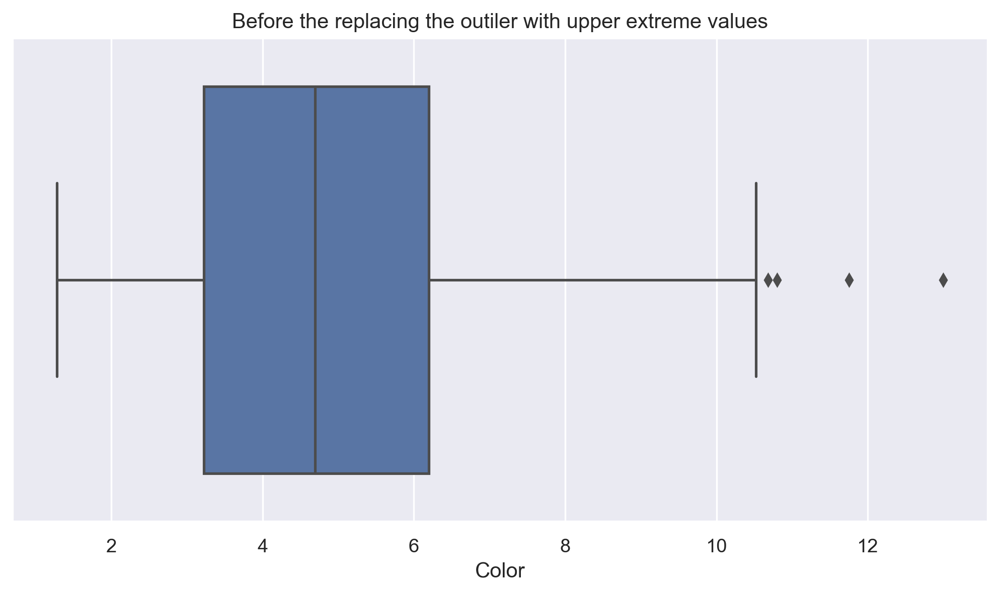

In [73]:
sns.boxplot(x= df["Color"])
plt.xlabel("Color")
plt.title("Before the replacing the outiler with upper extreme values")

In [76]:
df.loc[df["Color"]>10.670000000000002, "Color"] = 10.670000000000002

Text(0.5, 1.0, 'After the replacing the outiler with upper extreme values')

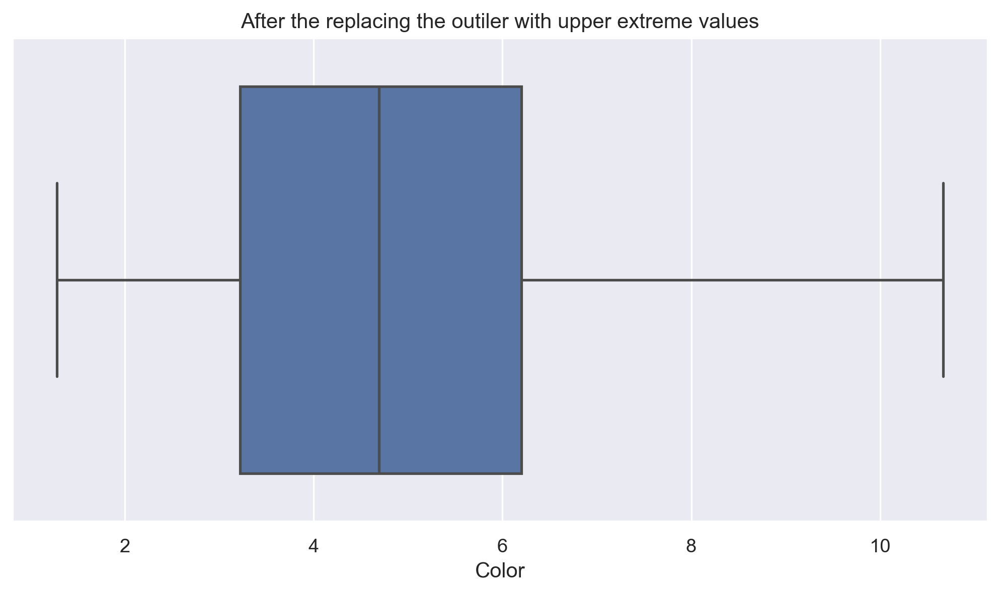

In [77]:
sns.boxplot(x= df["Color"])
plt.xlabel("Color")
plt.title("After the replacing the outiler with upper extreme values")

In [78]:
outlier_detection(df, "Hue")

(0.2762499999999998, 1.6262500000000002)

Text(0.5, 1.0, 'Before the replacing the outiler with upper extreme values')

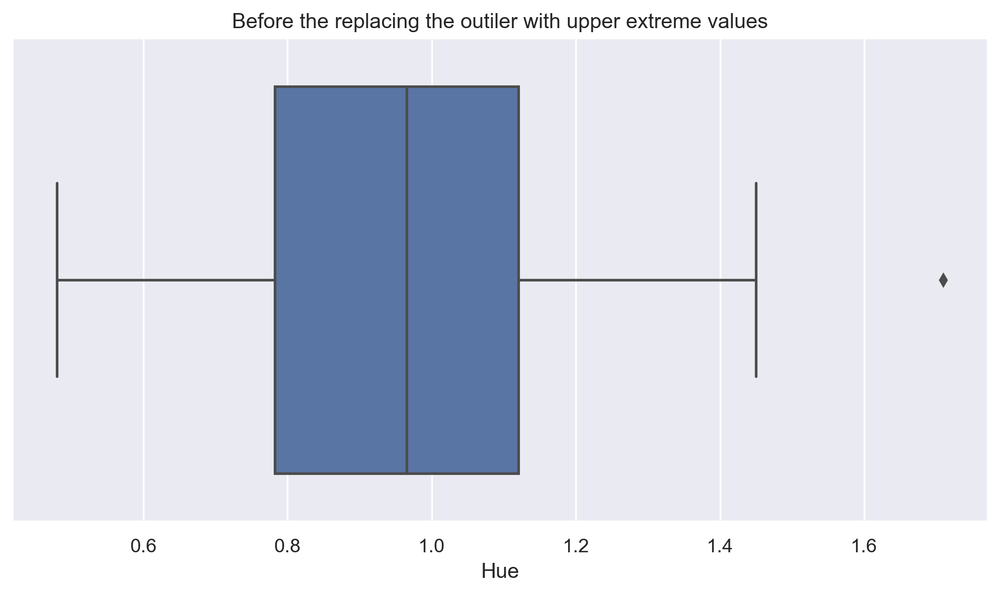

In [79]:
sns.boxplot(x= df["Hue"])
plt.xlabel("Hue")
plt.title("Before the replacing the outiler with upper extreme values")

In [80]:
df.loc[df["Hue"]>1.6262500000000002, "Hue"] = 1.6262500000000002

Text(0.5, 1.0, 'After the replacing the outiler with upper extreme values')

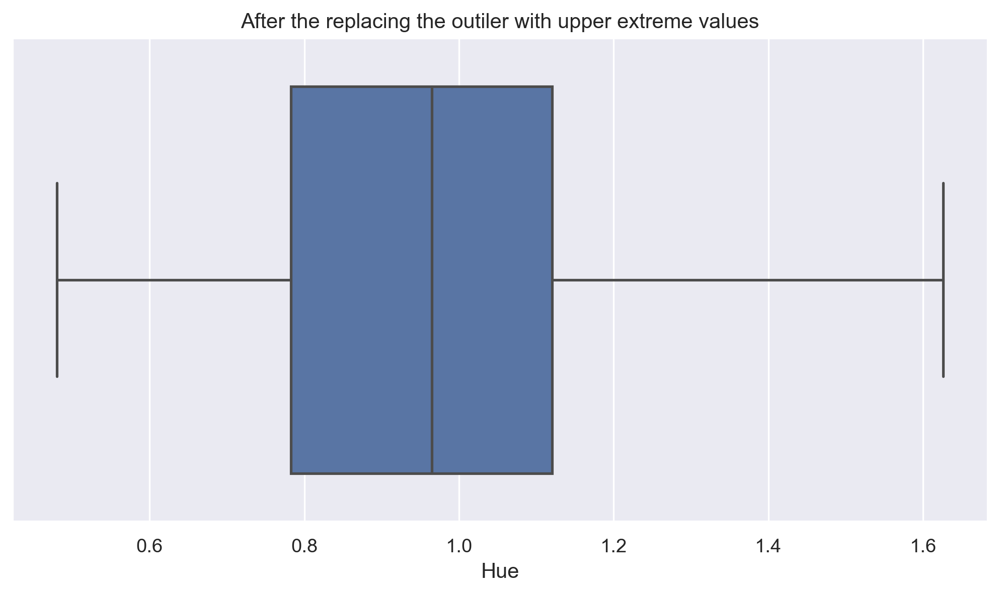

In [81]:
sns.boxplot(x= df["Hue"])
plt.xlabel("Hue")
plt.title("After the replacing the outiler with upper extreme values")

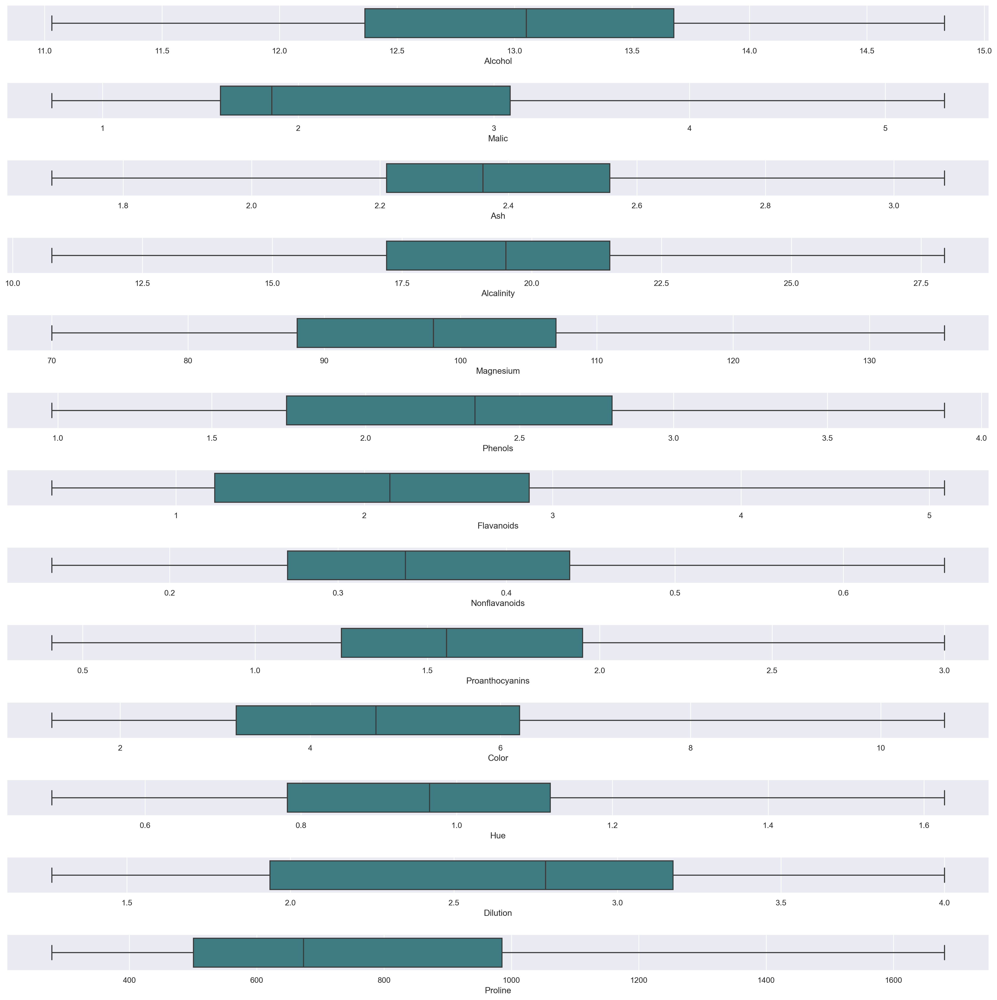

In [82]:
ot=df.copy() 
fig, axes=plt.subplots(13,1,figsize=(20,20),sharex=False,sharey=False)
sns.boxplot(x='Alcohol',data=ot,palette='crest',ax=axes[0])
sns.boxplot(x='Malic',data=ot,palette='crest',ax=axes[1])
sns.boxplot(x='Ash',data=ot,palette='crest',ax=axes[2])
sns.boxplot(x='Alcalinity',data=ot,palette='crest',ax=axes[3])
sns.boxplot(x='Magnesium',data=ot,palette='crest',ax=axes[4])
sns.boxplot(x='Phenols',data=ot,palette='crest',ax=axes[5])
sns.boxplot(x='Flavanoids',data=ot,palette='crest',ax=axes[6])
sns.boxplot(x='Nonflavanoids',data=ot,palette='crest',ax=axes[7])
sns.boxplot(x='Proanthocyanins',data=ot,palette='crest',ax=axes[8])
sns.boxplot(x='Color',data=ot,palette='crest',ax=axes[9])
sns.boxplot(x='Hue',data=ot,palette='crest',ax=axes[10])
sns.boxplot(x='Dilution',data=ot,palette='crest',ax=axes[11])
sns.boxplot(x='Proline',data=ot,palette='crest',ax=axes[12])
plt.tight_layout(pad=2.0)

# Now see all the above boxplot reflect there are no outliers deceted

# Scatter Plot and Correlation

In [83]:
sns.pairplot(df)

# Before we begin scaling, we should extract the target values from the independent columns. Because PCA only performs for independent columns.

In [86]:
df.head()

,Type,Alcohol,Malic,Ash,Alcalinity,Magnesium,Phenols,Flavanoids,Nonflavanoids,Proanthocyanins,Color,Hue,Dilution,Proline
0,1,14.23,1.71,2.43,15.6,127.0,2.80,3.06,0.28,2.29,5.64,1.04,3.92,1065
1,1,13.20,1.78,2.14,11.2,100.0,2.65,2.76,0.26,1.28,4.38,1.05,3.40,1050
2,1,13.16,2.36,2.67,18.6,101.0,2.80,3.24,0.30,2.81,5.68,1.03,3.17,1185
3,1,14.37,1.95,2.50,16.8,113.0,3.85,3.49,0.24,2.18,7.80,0.86,3.45,1480
4,1,13.24,2.59,2.87,21.0,118.0,2.80,2.69,0.39,1.82,4.32,1.04,2.93,735


In [89]:
x =df.iloc[:, 1:]
y = df["Type"]

In [90]:
x

,Alcohol,Malic,Ash,Alcalinity,Magnesium,Phenols,Flavanoids,Nonflavanoids,Proanthocyanins,Color,Hue,Dilution,Proline
0,14.23,1.7100,2.43,15.6,127.0,2.80,3.06,0.28,2.29,5.64,1.04,3.92,1065
1,13.20,1.7800,2.14,11.2,100.0,2.65,2.76,0.26,1.28,4.38,1.05,3.40,1050
2,13.16,2.3600,2.67,18.6,101.0,2.80,3.24,0.30,2.81,5.68,1.03,3.17,1185
3,14.37,1.9500,2.50,16.8,113.0,3.85,3.49,0.24,2.18,7.80,0.86,3.45,1480
4,13.24,2.5900,2.87,21.0,118.0,2.80,2.69,0.39,1.82,4.32,1.04,2.93,735
...,...,...,...,...,...,...,...,...,...,...,...,...,...
173,13.71,5.3025,2.45,20.5,95.0,1.68,0.61,0.52,1.06,7.70,0.64,1.74,740
174,13.40,3.9100,2.48,23.0,102.0,1.80,0.75,0.43,1.41,7.30,0.70,1.56,750
175,13.27,4.2800,2.26,20.0,120.0,1.59,0.69,0.43,1.35,10.20,0.59,1.56,835
176,13.17,2.5900,2.37,20.0,120.0,1.65,0.68,0.53,1.46,9.30,0.60,1.62,840


In [91]:
y

0      1
1      1
2      1
3      1
4      1
      ..
173    3
174    3
175    3
176    3
177    3
Name: Type, Length: 178, dtype: int64

# *Scaling the data*

- Standardization
    - Uses Z score for scaling.
    - Scale values in such a way that the mean = 0 and standard deviation is 1.

In [84]:
from sklearn.preprocessing import StandardScaler

In [93]:
sc = StandardScaler()

x = sc.fit_transform(x)
pd.DataFrame(x).describe()

,0,1,2,3,4,5,6,7,8,9,10,11,12
count,178.000000,1.780000e+02,1.780000e+02,1.780000e+02,1.780000e+02,1.780000e+02,178.000000,178.000000,178.000000,1.780000e+02,1.780000e+02,178.000000,178.000000
mean,0.000000,-3.991813e-17,-3.118604e-17,7.983626e-17,-1.995907e-17,-7.983626e-17,0.000000,0.000000,0.000000,-4.989766e-18,-3.991813e-17,0.000000,0.000000
std,1.002821,1.002821e+00,1.002821e+00,1.002821e+00,1.002821e+00,1.002821e+00,1.002821,1.002821,1.002821,1.002821e+00,1.002821e+00,1.002821,1.002821
min,-2.434235,-1.449701e+00,-2.578195e+00,-2.662213e+00,-2.204108e+00,-2.107246e+00,-1.695971,-1.868234,-2.113014,-1.666938e+00,-2.106273e+00,-1.895054,-1.493188
25%,-0.788245,-6.635217e-01,-5.959788e-01,-6.948555e-01,-8.584597e-01,-8.854682e-01,-0.827539,-0.740141,-0.603805,-8.064445e-01,-7.704749e-01,-0.952248,-0.784638
50%,0.061000,-4.242499e-01,-2.555683e-02,6.682950e-03,-1.108774e-01,9.595986e-02,0.106150,-0.176095,-0.055818,-1.544213e-01,3.541993e-02,0.237735,-0.233720
75%,0.836129,6.855158e-01,7.254987e-01,6.167164e-01,5.619467e-01,8.089974e-01,0.849085,0.609541,0.653869,5.153441e-01,7.198786e-01,0.788587,0.758249
max,2.259772,2.709072e+00,2.707715e+00,2.584074e+00,2.692556e+00,2.539515e+00,3.062832,2.402403,2.540381,2.498027e+00,2.955409e+00,1.960915,2.971473


In [94]:
from sklearn.decomposition import PCA

# PCA

In [95]:
pca = PCA()
pcs = pca.fit_transform(x)
pd.DataFrame(pcs)

,0,1,2,3,4,5,6,7,8,9,10,11,12
0,3.358147,-1.520222,-0.126375,-0.224356,0.710891,-0.176645,0.701154,0.019187,0.689257,-1.031209,-0.359055,0.599343,-0.108299
1,2.229215,0.333261,-2.042838,-0.365783,-0.107448,-0.984902,0.048001,0.991649,-0.379664,-0.208787,-0.120602,0.372289,0.003640
2,2.540057,-1.036953,1.018845,0.766907,-0.363113,0.537666,0.412691,-0.464401,-1.164755,-0.136538,-0.289991,0.046713,0.042033
3,3.781124,-2.782566,-0.149224,0.593304,-0.273054,0.132210,-0.394978,0.694895,0.001904,-0.241293,0.688896,-0.318833,-0.380455
4,1.016872,-0.955225,2.113169,-0.431732,0.357108,-0.386733,0.487160,0.377559,0.283486,0.036566,-0.577236,-0.165368,-0.050547
...,...,...,...,...,...,...,...,...,...,...,...,...,...
173,-3.311751,-2.173369,-0.383365,0.925038,-0.633273,-1.060998,0.685717,-0.130305,-0.027147,0.235376,0.111934,0.102554,-0.135217
174,-2.612425,-1.797712,0.210332,0.398412,0.192034,0.011534,0.136131,-0.565178,-0.063488,0.222939,0.236649,-0.309409,-0.181156
175,-2.671169,-2.865301,-0.975126,0.360633,1.185098,0.354148,0.853504,0.013484,0.020689,0.267263,0.595734,0.646957,-0.025525
176,-2.371603,-2.393808,-0.561485,-0.643948,0.658651,1.252325,0.813131,0.351025,0.086492,-0.495366,0.353956,0.346681,-0.083471


In [96]:
pca.explained_variance_ratio_

array([0.36475803, 0.19609775, 0.10911182, 0.07062378, 0.06296983,
       0.04815067, 0.04031504, 0.02744533, 0.02232516, 0.01931106,
       0.01755433, 0.01326634, 0.00807088])

In [97]:
np.cumsum(pca.explained_variance_ratio_)

array([0.36475803, 0.56085577, 0.66996759, 0.74059137, 0.8035612 ,
       0.85171187, 0.89202691, 0.91947224, 0.9417974 , 0.96110846,
       0.97866279, 0.99192912, 1.        ])

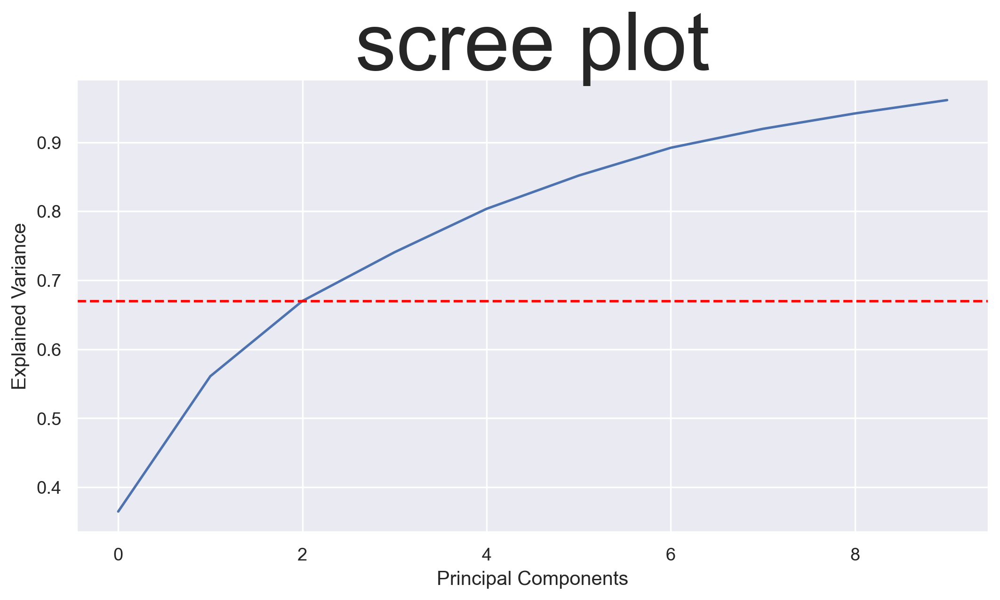

In [107]:
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel("Principal Components")
plt.ylabel("Explained Variance")
plt.title("scree plot", size = 50)
plt.axhline(y = 0.66996759, linestyle = "--", color ="red")

In [108]:
pca = PCA(n_components=3)
pcs = pca.fit_transform(x)
pcs

array([[ 3.35814747e+00, -1.52022185e+00, -1.26374924e-01],
       [ 2.22921481e+00,  3.33261369e-01, -2.04283756e+00],
       [ 2.54005743e+00, -1.03695315e+00,  1.01884481e+00],
       [ 3.78112387e+00, -2.78256636e+00, -1.49224187e-01],
       [ 1.01687180e+00, -9.55225073e-01,  2.11316944e+00],
       [ 3.08026004e+00, -2.15271868e+00, -6.01559098e-01],
       [ 2.47175534e+00, -1.15588494e+00, -9.58401105e-01],
       [ 2.07139203e+00, -1.69122109e+00,  2.11298994e-01],
       [ 2.54045510e+00, -8.83884920e-01, -1.77881618e+00],
       [ 2.77052130e+00, -7.74653432e-01, -9.99870293e-01],
       [ 3.50454254e+00, -1.29825486e+00, -4.07371706e-01],
       [ 1.76782977e+00, -5.93348710e-01, -1.18098102e+00],
       [ 2.12641571e+00, -6.40665953e-01, -8.58112765e-01],
       [ 3.50743925e+00, -1.07718241e+00, -1.19594047e+00],
       [ 4.36509305e+00, -2.08205163e+00, -1.26244228e+00],
       [ 2.31969491e+00, -1.73051508e+00,  2.68412244e-01],
       [ 2.19278384e+00, -2.39898401e+00

In [109]:
data = pd.DataFrame(pcs,columns=['PC1','PC2', "PC3"])
data

,PC1,PC2,PC3
0,3.358147,-1.520222,-0.126375
1,2.229215,0.333261,-2.042838
2,2.540057,-1.036953,1.018845
3,3.781124,-2.782566,-0.149224
4,1.016872,-0.955225,2.113169
...,...,...,...
173,-3.311751,-2.173369,-0.383365
174,-2.612425,-1.797712,0.210332
175,-2.671169,-2.865301,-0.975126
176,-2.371603,-2.393808,-0.561485


In [110]:
y

0      1
1      1
2      1
3      1
4      1
      ..
173    3
174    3
175    3
176    3
177    3
Name: Type, Length: 178, dtype: int64

In [111]:
data["Type"] = y

In [112]:
data

,PC1,PC2,PC3,Type
0,3.358147,-1.520222,-0.126375,1
1,2.229215,0.333261,-2.042838,1
2,2.540057,-1.036953,1.018845,1
3,3.781124,-2.782566,-0.149224,1
4,1.016872,-0.955225,2.113169,1
...,...,...,...,...
173,-3.311751,-2.173369,-0.383365,3
174,-2.612425,-1.797712,0.210332,3
175,-2.671169,-2.865301,-0.975126,3
176,-2.371603,-2.393808,-0.561485,3


# Hierarchical Clustering

# Dendrogram with single and complete linkage

In [113]:
from scipy.cluster import hierarchy

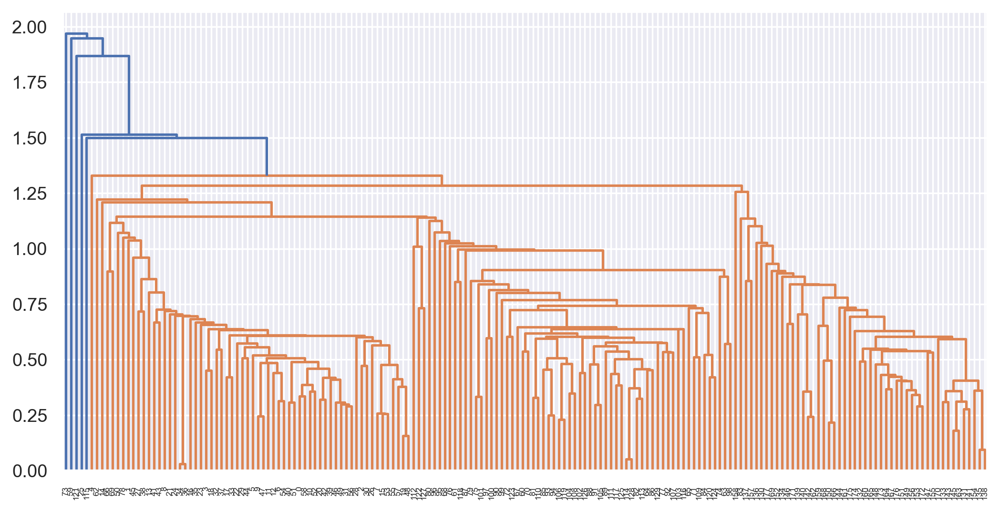

In [114]:
lk = hierarchy.linkage(data, method="single")
dendrogram = hierarchy.dendrogram(lk)

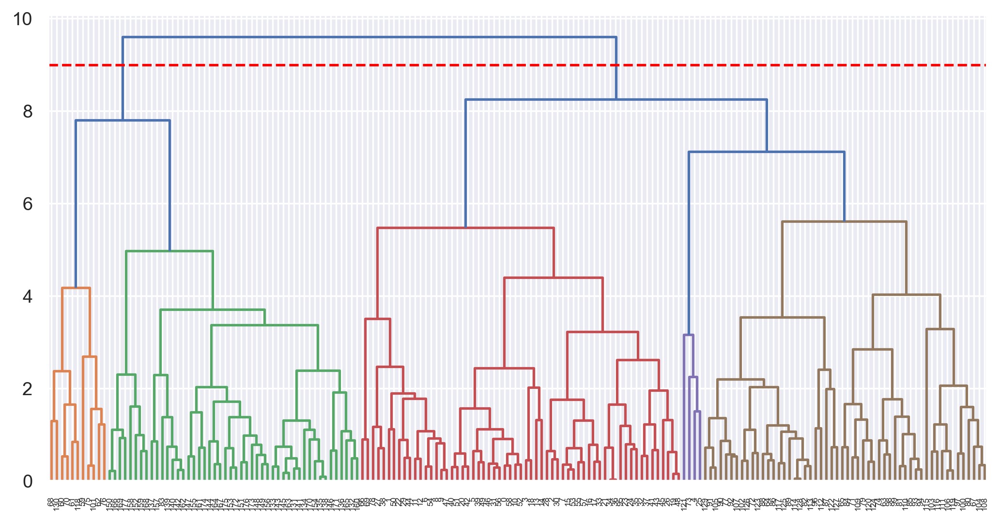

In [117]:
lk = hierarchy.linkage(data, method="complete")
dendrogram = hierarchy.dendrogram(lk)
plt.axhline(y = 9, linestyle= "--", color = "red")

# Model Building

In [118]:
from sklearn.cluster import AgglomerativeClustering

In [119]:
hc = AgglomerativeClustering(n_clusters=2)

ypred = hc.fit_predict(data)
ypred

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1], dtype=int64)

In [120]:
len(ypred)

178

In [121]:
data["Hierarchical Clustering"] = ypred
data

,PC1,PC2,PC3,Type,Hierarchical Clustering
0,3.358147,-1.520222,-0.126375,1,0
1,2.229215,0.333261,-2.042838,1,0
2,2.540057,-1.036953,1.018845,1,0
3,3.781124,-2.782566,-0.149224,1,0
4,1.016872,-0.955225,2.113169,1,0
...,...,...,...,...,...
173,-3.311751,-2.173369,-0.383365,3,1
174,-2.612425,-1.797712,0.210332,3,1
175,-2.671169,-2.865301,-0.975126,3,1
176,-2.371603,-2.393808,-0.561485,3,1


# Analyzing the clusters

In [123]:
data.groupby("Hierarchical Clustering").agg("mean")

,PC1,PC2,PC3,Type
Hierarchical Clustering,,,,
0,1.026112,0.461369,0.059738,1.553846
1,-2.779053,-1.249541,-0.161792,2.979167


<Axes: xlabel='PC1', ylabel='PC2'>

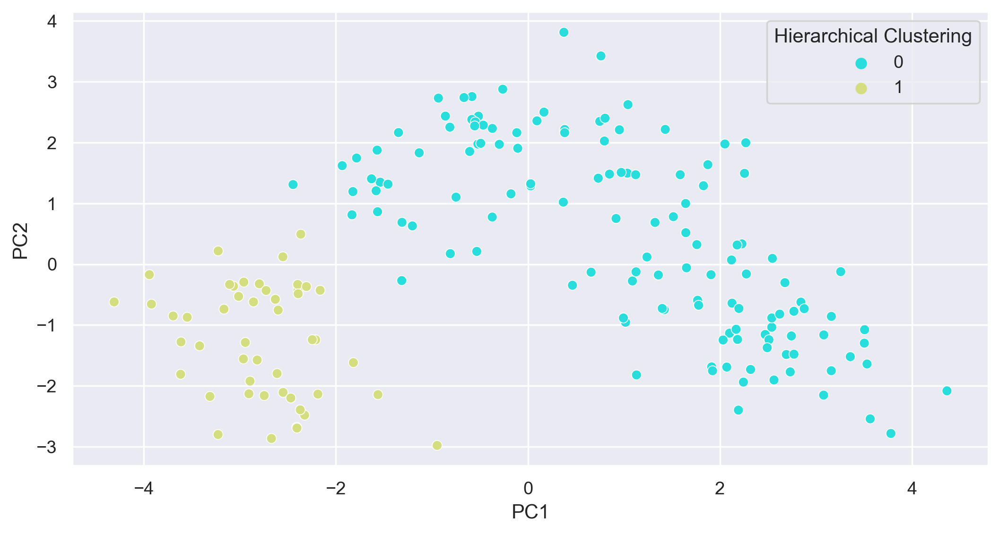

In [124]:
sns.scatterplot(x = data["PC1"], y= data["PC2"], hue=data["Hierarchical Clustering"], palette = "rainbow")

<Axes: xlabel='PC1', ylabel='PC3'>

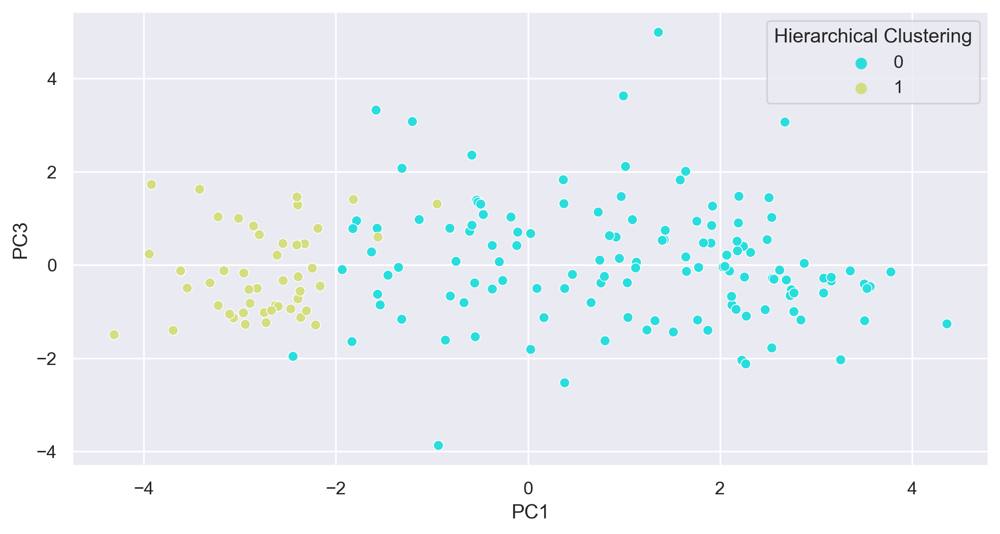

In [125]:
sns.scatterplot(x = data["PC1"], y= data["PC3"], hue=data["Hierarchical Clustering"], palette = "rainbow")

<Axes: xlabel='PC2', ylabel='PC3'>

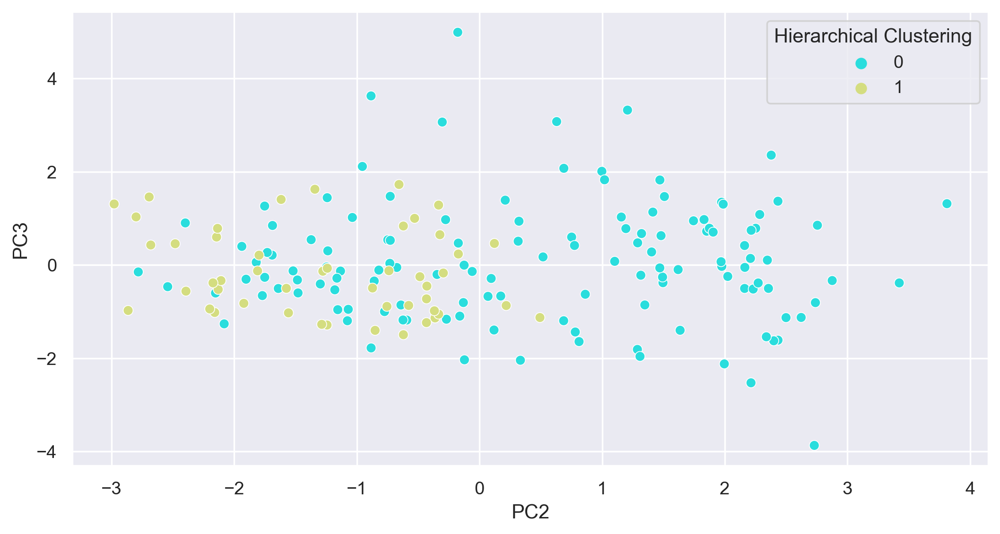

In [126]:
sns.scatterplot(x = data["PC2"], y= data["PC3"], hue=data["Hierarchical Clustering"], palette = "rainbow")

# K-Means Clustering

In [127]:
data

,PC1,PC2,PC3,Type,Hierarchical Clustering
0,3.358147,-1.520222,-0.126375,1,0
1,2.229215,0.333261,-2.042838,1,0
2,2.540057,-1.036953,1.018845,1,0
3,3.781124,-2.782566,-0.149224,1,0
4,1.016872,-0.955225,2.113169,1,0
...,...,...,...,...,...
173,-3.311751,-2.173369,-0.383365,3,1
174,-2.612425,-1.797712,0.210332,3,1
175,-2.671169,-2.865301,-0.975126,3,1
176,-2.371603,-2.393808,-0.561485,3,1


# Model Building

In [130]:
from sklearn.cluster import KMeans

In [133]:
km = KMeans()
yp = km.fit_predict(data)
km

KMeans()

In [134]:
yp

array([6, 4, 2, 6, 2, 6, 6, 6, 4, 6, 6, 4, 4, 6, 6, 6, 6, 2, 6, 6, 6, 2,
       4, 4, 2, 2, 4, 4, 2, 4, 2, 6, 4, 2, 2, 2, 2, 4, 4, 6, 6, 4, 6, 4,
       4, 6, 6, 6, 6, 6, 4, 6, 6, 6, 6, 6, 6, 6, 6, 7, 7, 7, 7, 0, 3, 0,
       0, 7, 7, 0, 7, 2, 3, 2, 0, 7, 7, 3, 4, 3, 0, 0, 3, 5, 0, 0, 3, 3,
       3, 3, 3, 3, 3, 0, 0, 2, 3, 0, 0, 0, 7, 7, 3, 7, 0, 3, 7, 3, 7, 0,
       0, 3, 3, 3, 3, 0, 7, 3, 7, 7, 0, 2, 3, 3, 0, 3, 3, 3, 3, 3, 5, 5,
       5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 1, 1, 1, 1, 1,
       5, 1, 1, 1, 1, 1, 5, 5, 5, 5, 5, 5, 1, 5, 1, 1, 5, 5, 1, 1, 1, 1,
       1, 1])

# cluster centre

In [135]:
km.cluster_centers_

array([[ 1.19948576e+00,  1.93964796e+00,  9.59901945e-02,
         2.00000000e+00,  1.11022302e-16],
       [-2.54999020e+00, -2.23348954e+00,  1.90247631e-01,
         3.00000000e+00,  1.00000000e+00],
       [ 1.78322609e+00, -5.66176561e-01,  1.61282714e+00,
         1.25000000e+00,  1.11022302e-16],
       [-8.32254772e-01,  1.61450147e+00,  1.01054922e+00,
         2.00000000e+00,  1.66533454e-16],
       [ 1.78053201e+00, -6.70102487e-02, -8.83015918e-01,
         1.05882353e+00,  1.11022302e-16],
       [-2.87530100e+00, -5.93716419e-01, -4.18129970e-01,
         2.96666667e+00,  9.66666667e-01],
       [ 2.77835499e+00, -1.49787483e+00, -3.11903350e-01,
         1.00000000e+00,  1.66533454e-16],
       [-6.41612000e-01,  1.93417130e+00, -1.31829103e+00,
         2.00000000e+00,  1.11022302e-16]])

# Visualize the clusters

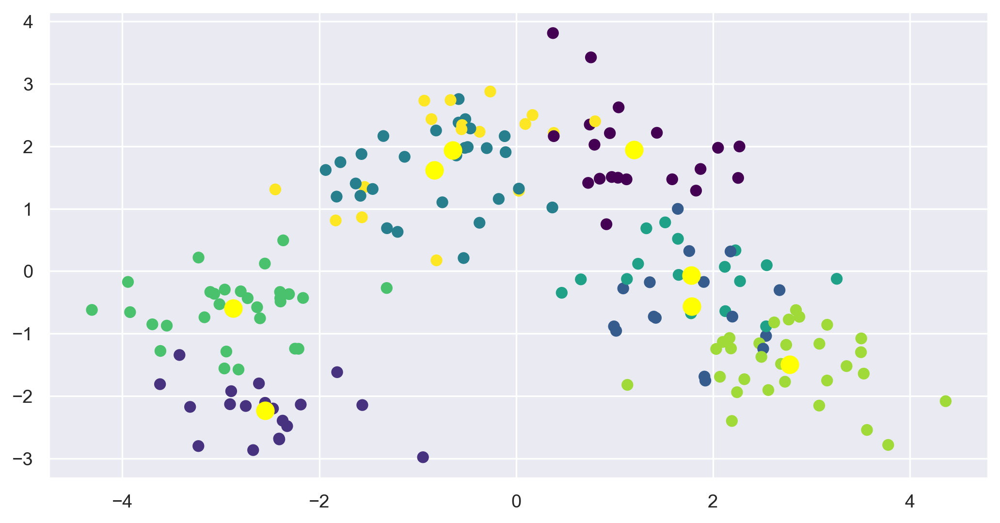

In [137]:
plt.scatter(data.iloc[:, 0], data.iloc[:, 1], c=yp, cmap="viridis")
plt.scatter(km.cluster_centers_[:,0],km.cluster_centers_[0:,1], c = "yellow", s = 100)

In [138]:
km.inertia_

271.28792715535593

# Elbow graph 

In [139]:
wcss = []

for i in range(1,11):
    km = KMeans(n_clusters=i)
    km.fit_predict(x)
    wcss.append(km.inertia_)

In [140]:
wcss

[2314.0000000000005,
 1654.9060813507995,
 1266.0703462093168,
 1165.962127758858,
 1091.1108812742864,
 1051.0775966744272,
 985.2756818244175,
 946.6587644452452,
 908.588075870844,
 875.9071184368782]

Text(0.5, 1.0, 'Elbow Graph')

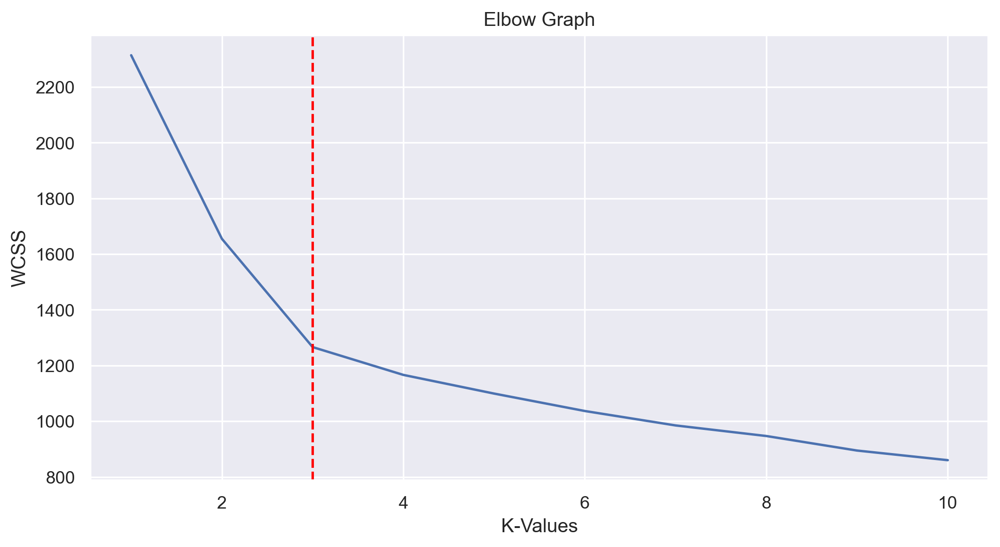

In [184]:
plt.plot(range(1,11),wcss)
plt.axvline(x = 3, linestyle = '--', color = 'red')
plt.xlabel('K-Values')
plt.ylabel('WCSS')
plt.title('Elbow Graph')

# Final Model

In [170]:
km = KMeans(n_clusters=3)
ypred = km.fit_predict(data)
ypred

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2])

In [171]:
km.cluster_centers_

array([[ 2.28971504e+00, -9.40572688e-01,  5.02628355e-03,
         1.04838710e+00, -2.22044605e-16,  1.00000000e+00],
       [-1.08261025e-01,  1.76960150e+00,  1.28620366e-01,
         2.00000000e+00, -1.11022302e-16,  7.76119403e-01],
       [-2.74916008e+00, -1.22954681e+00, -1.82228451e-01,
         2.97959184e+00,  9.79591837e-01,  7.77156117e-16]])

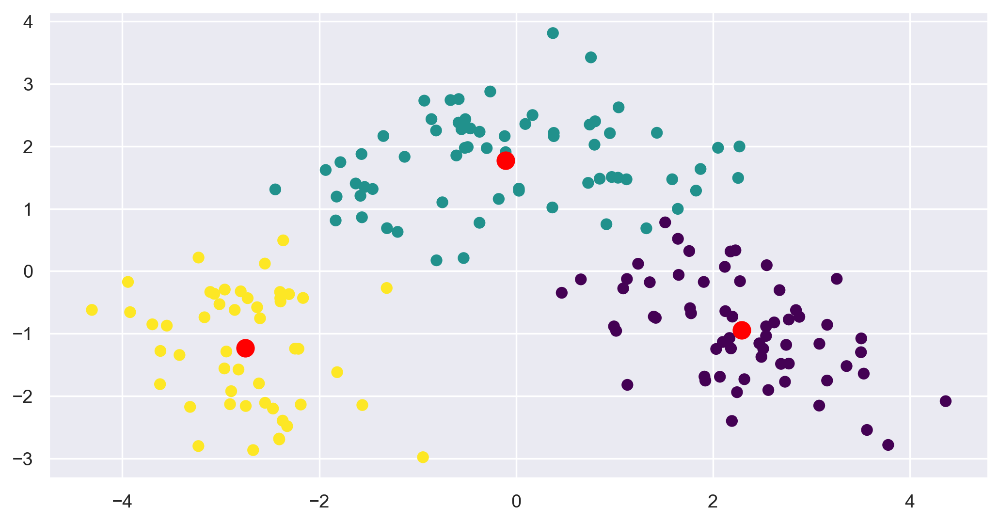

In [172]:
plt.scatter(data.iloc[:, 0], data.iloc[:, 1], c=ypred, cmap="viridis")
plt.scatter(km.cluster_centers_[:,0],km.cluster_centers_[0:,1], c = "red", s = 100)

# Evaluation of Kmeans

# Silhouette score

In [173]:
from sklearn.metrics import silhouette_score

In [174]:
silhouette_score(data,ypred)

0.47350399051018877

# Analyzing clusters

In [151]:
data['Kmeans cluster'] = ypred
data

,PC1,PC2,PC3,Type,Hierarchical Clustering,Kmeans cluster
0,3.358147,-1.520222,-0.126375,1,0,1
1,2.229215,0.333261,-2.042838,1,0,1
2,2.540057,-1.036953,1.018845,1,0,1
3,3.781124,-2.782566,-0.149224,1,0,1
4,1.016872,-0.955225,2.113169,1,0,1
...,...,...,...,...,...,...
173,-3.311751,-2.173369,-0.383365,3,1,0
174,-2.612425,-1.797712,0.210332,3,1,0
175,-2.671169,-2.865301,-0.975126,3,1,0
176,-2.371603,-2.393808,-0.561485,3,1,0


# with Orginal data

In [175]:
x

array([[ 1.51861254, -0.56553422,  0.24064008, ...,  0.36660959,
         1.84791957,  1.01300893],
       [ 0.24628963, -0.50172839, -0.86217567, ...,  0.41076822,
         1.1134493 ,  0.96524152],
       [ 0.19687903,  0.02694849,  1.15331518, ...,  0.32245097,
         0.78858745,  1.39514818],
       ...,
       [ 0.33275817,  1.77705125, -0.40583812, ..., -1.6205284 ,
        -1.48544548,  0.28057537],
       [ 0.20923168,  0.23659622,  0.0124713 , ..., -1.57636978,
        -1.40069891,  0.29649784],
       [ 1.39508604,  1.61297912,  1.41951209, ..., -1.53221115,
        -1.42894777, -0.59516041]])

In [176]:
km = KMeans()
yp = km.fit_predict(x)
km

KMeans()

In [177]:
yp

array([2, 2, 2, 2, 6, 2, 2, 6, 2, 2, 2, 2, 2, 2, 2, 6, 6, 6, 2, 2, 2, 6,
       2, 6, 6, 6, 6, 2, 6, 2, 6, 2, 6, 6, 6, 6, 6, 6, 1, 2, 2, 4, 2, 4,
       2, 6, 2, 2, 2, 2, 2, 2, 2, 6, 2, 2, 2, 6, 2, 1, 1, 1, 1, 4, 7, 3,
       4, 4, 1, 3, 1, 6, 7, 6, 4, 1, 1, 1, 3, 4, 4, 4, 7, 0, 3, 4, 7, 7,
       7, 7, 7, 7, 7, 4, 4, 3, 3, 4, 4, 4, 4, 1, 4, 4, 4, 7, 4, 7, 4, 3,
       4, 4, 7, 7, 7, 7, 4, 4, 0, 4, 4, 6, 7, 4, 4, 4, 4, 7, 7, 7, 1, 5,
       5, 5, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 5, 0, 0, 0, 5, 5, 5, 5, 5, 5,
       5, 0, 5, 0, 5, 5, 0, 0, 0, 0, 5, 0, 5, 5, 5, 5, 0, 5, 5, 0, 5, 5,
       5, 5])

In [178]:
wcss = []

for i in range(1,11):
    km = KMeans(n_clusters=i)
    km.fit_predict(x)
    wcss.append(km.inertia_)

In [179]:
wcss

[2314.0000000000005,
 1654.9060813507995,
 1266.0703462093168,
 1166.2027364061353,
 1099.1655913192449,
 1036.5774836660216,
 984.7710882488693,
 946.8069825554744,
 894.5939897597495,
 860.0381764250317]

Text(0.5, 1.0, 'Elbow Graph')

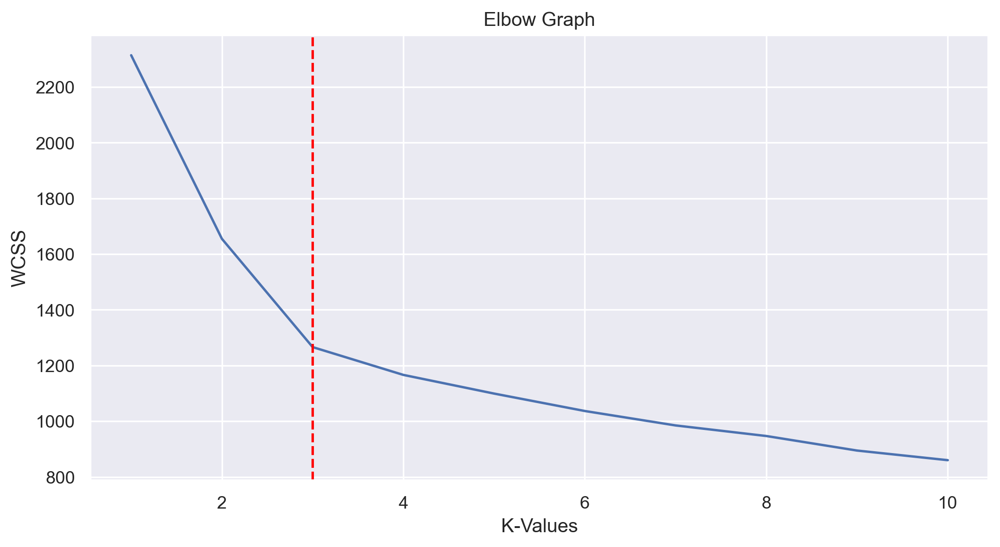

In [181]:
plt.plot(range(1,11),wcss)
plt.axvline(x = 3, linestyle = '--', color = 'red')
plt.xlabel('K-Values')
plt.ylabel('WCSS')
plt.title('Elbow Graph')

In [182]:
km = KMeans(n_clusters=3)
ypred = km.fit_predict(x)
ypred

array([2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 0, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0])

In [183]:
silhouette_score(x,ypred)

0.2854626783251893

# The K-Menas silhouette score for all columns is 29%, however when running the PCA and utilizing only the first three columns and after completing the K-means, the accuracy score will increase to 47%.